# Задание 1: Image→Image Retrieval

В этом ноутбуке реализуется система поиска по визуальной похожести изображений


In [ ]:
!pip install -q datasets torch torchvision transformers open-clip-torch faiss-cpu pillow numpy pandas matplotlib tqdm huggingface-hub


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms
from transformers import AutoProcessor, AutoModel
from datasets import load_dataset
import faiss
from tqdm.auto import tqdm
import os
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)
torch.manual_seed(42)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"{device=}")


device='cuda'


## Загрузка датасета

Загрузим датасет WikiArt

In [ ]:
dataset = load_dataset("huggan/wikiart", split="train")

SAMPLE_SIZE = 5000
dataset = dataset.shuffle(seed=42).select(range(min(SAMPLE_SIZE, len(dataset))))

README.md: 0.00B [00:00, ?B/s]

Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

dataset_infos.json: 0.00B [00:00, ?B/s]

data/train-00000-of-00072.parquet:   0%|          | 0.00/522M [00:00<?, ?B/s]

data/train-00001-of-00072.parquet:   0%|          | 0.00/518M [00:00<?, ?B/s]

data/train-00002-of-00072.parquet:   0%|          | 0.00/533M [00:00<?, ?B/s]

data/train-00003-of-00072.parquet:   0%|          | 0.00/533M [00:00<?, ?B/s]

data/train-00004-of-00072.parquet:   0%|          | 0.00/532M [00:00<?, ?B/s]

data/train-00005-of-00072.parquet:   0%|          | 0.00/519M [00:00<?, ?B/s]

data/train-00006-of-00072.parquet:   0%|          | 0.00/523M [00:00<?, ?B/s]

data/train-00007-of-00072.parquet:   0%|          | 0.00/532M [00:00<?, ?B/s]

data/train-00008-of-00072.parquet:   0%|          | 0.00/532M [00:00<?, ?B/s]

data/train-00009-of-00072.parquet:   0%|          | 0.00/531M [00:00<?, ?B/s]

data/train-00010-of-00072.parquet:   0%|          | 0.00/530M [00:00<?, ?B/s]

data/train-00011-of-00072.parquet:   0%|          | 0.00/539M [00:00<?, ?B/s]

data/train-00012-of-00072.parquet:   0%|          | 0.00/523M [00:00<?, ?B/s]

data/train-00013-of-00072.parquet:   0%|          | 0.00/555M [00:00<?, ?B/s]

data/train-00014-of-00072.parquet:   0%|          | 0.00/453M [00:00<?, ?B/s]

data/train-00015-of-00072.parquet:   0%|          | 0.00/563M [00:00<?, ?B/s]

data/train-00016-of-00072.parquet:   0%|          | 0.00/510M [00:00<?, ?B/s]

data/train-00017-of-00072.parquet:   0%|          | 0.00/459M [00:00<?, ?B/s]

data/train-00018-of-00072.parquet:   0%|          | 0.00/457M [00:00<?, ?B/s]

data/train-00019-of-00072.parquet:   0%|          | 0.00/453M [00:00<?, ?B/s]

data/train-00020-of-00072.parquet:   0%|          | 0.00/455M [00:00<?, ?B/s]

data/train-00021-of-00072.parquet:   0%|          | 0.00/456M [00:00<?, ?B/s]

data/train-00022-of-00072.parquet:   0%|          | 0.00/448M [00:00<?, ?B/s]

data/train-00023-of-00072.parquet:   0%|          | 0.00/453M [00:00<?, ?B/s]

data/train-00024-of-00072.parquet:   0%|          | 0.00/444M [00:00<?, ?B/s]

data/train-00025-of-00072.parquet:   0%|          | 0.00/448M [00:00<?, ?B/s]

data/train-00026-of-00072.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

data/train-00027-of-00072.parquet:   0%|          | 0.00/455M [00:00<?, ?B/s]

data/train-00028-of-00072.parquet:   0%|          | 0.00/442M [00:00<?, ?B/s]

data/train-00029-of-00072.parquet:   0%|          | 0.00/449M [00:00<?, ?B/s]

data/train-00030-of-00072.parquet:   0%|          | 0.00/452M [00:00<?, ?B/s]

data/train-00031-of-00072.parquet:   0%|          | 0.00/450M [00:00<?, ?B/s]

data/train-00032-of-00072.parquet:   0%|          | 0.00/460M [00:00<?, ?B/s]

data/train-00033-of-00072.parquet:   0%|          | 0.00/455M [00:00<?, ?B/s]

data/train-00034-of-00072.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

data/train-00035-of-00072.parquet:   0%|          | 0.00/455M [00:00<?, ?B/s]

data/train-00036-of-00072.parquet:   0%|          | 0.00/446M [00:00<?, ?B/s]

data/train-00037-of-00072.parquet:   0%|          | 0.00/453M [00:00<?, ?B/s]

data/train-00038-of-00072.parquet:   0%|          | 0.00/454M [00:00<?, ?B/s]

data/train-00039-of-00072.parquet:   0%|          | 0.00/454M [00:00<?, ?B/s]

data/train-00040-of-00072.parquet:   0%|          | 0.00/440M [00:00<?, ?B/s]

data/train-00041-of-00072.parquet:   0%|          | 0.00/455M [00:00<?, ?B/s]

data/train-00042-of-00072.parquet:   0%|          | 0.00/446M [00:00<?, ?B/s]

data/train-00043-of-00072.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

data/train-00044-of-00072.parquet:   0%|          | 0.00/451M [00:00<?, ?B/s]

data/train-00045-of-00072.parquet:   0%|          | 0.00/452M [00:00<?, ?B/s]

data/train-00046-of-00072.parquet:   0%|          | 0.00/458M [00:00<?, ?B/s]

data/train-00047-of-00072.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00048-of-00072.parquet:   0%|          | 0.00/491M [00:00<?, ?B/s]

data/train-00049-of-00072.parquet:   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00050-of-00072.parquet:   0%|          | 0.00/472M [00:00<?, ?B/s]

data/train-00051-of-00072.parquet:   0%|          | 0.00/515M [00:00<?, ?B/s]

data/train-00052-of-00072.parquet:   0%|          | 0.00/514M [00:00<?, ?B/s]

data/train-00053-of-00072.parquet:   0%|          | 0.00/509M [00:00<?, ?B/s]

data/train-00054-of-00072.parquet:   0%|          | 0.00/462M [00:00<?, ?B/s]

data/train-00055-of-00072.parquet:   0%|          | 0.00/453M [00:00<?, ?B/s]

data/train-00056-of-00072.parquet:   0%|          | 0.00/414M [00:00<?, ?B/s]

data/train-00057-of-00072.parquet:   0%|          | 0.00/405M [00:00<?, ?B/s]

data/train-00058-of-00072.parquet:   0%|          | 0.00/359M [00:00<?, ?B/s]

data/train-00059-of-00072.parquet:   0%|          | 0.00/304M [00:00<?, ?B/s]

data/train-00060-of-00072.parquet:   0%|          | 0.00/449M [00:00<?, ?B/s]

data/train-00061-of-00072.parquet:   0%|          | 0.00/438M [00:00<?, ?B/s]

data/train-00062-of-00072.parquet:   0%|          | 0.00/447M [00:00<?, ?B/s]

data/train-00063-of-00072.parquet:   0%|          | 0.00/435M [00:00<?, ?B/s]

data/train-00064-of-00072.parquet:   0%|          | 0.00/446M [00:00<?, ?B/s]

data/train-00065-of-00072.parquet:   0%|          | 0.00/439M [00:00<?, ?B/s]

data/train-00066-of-00072.parquet:   0%|          | 0.00/448M [00:00<?, ?B/s]

data/train-00067-of-00072.parquet:   0%|          | 0.00/436M [00:00<?, ?B/s]

data/train-00068-of-00072.parquet:   0%|          | 0.00/474M [00:00<?, ?B/s]

data/train-00069-of-00072.parquet:   0%|          | 0.00/454M [00:00<?, ?B/s]

data/train-00070-of-00072.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/train-00071-of-00072.parquet:   0%|          | 0.00/367M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/81444 [00:00<?, ? examples/s]

Loading dataset shards:   0%|          | 0/45 [00:00<?, ?it/s]

Доступные поля: dict_keys(['image', 'artist', 'genre', 'style'])


In [ ]:
example = dataset[0]
print(f"Размер датасета {len(dataset)}")
print(f"Доступные поля: {example.keys()}")

Размер датасета 5000
Доступные поля: dict_keys(['image', 'artist', 'genre', 'style'])


In [ ]:
# сразу выкладываю датасет на hf, чтобы в дальнейшем загружать быстрее
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
dataset.push_to_hub("wikiart_5k", private=False)

Uploading the dataset shards:   0%|          | 0/5 [00:00<?, ? shards/s]

Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/10 [00:00<?, ?ba/s]

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

                              :   0%|          |  524kB /  403MB            

Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/10 [00:00<?, ?ba/s]

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

                              :   0%|          | 55.6kB /  422MB            

Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/10 [00:00<?, ?ba/s]

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

                              :   1%|          | 3.71MB /  405MB            

Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/10 [00:00<?, ?ba/s]

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

                              :   0%|          | 52.6kB /  413MB            

Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/10 [00:00<?, ?ba/s]

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

                              :   0%|          | 40.3kB /  421MB            

CommitInfo(commit_url='https://huggingface.co/datasets/lyubachuba/wikiart_5k/commit/f74ff4e3842348106a4da7db89ea8d7a9d4286ef', commit_message='Upload dataset', commit_description='', oid='f74ff4e3842348106a4da7db89ea8d7a9d4286ef', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/lyubachuba/wikiart_5k', endpoint='https://huggingface.co', repo_type='dataset', repo_id='lyubachuba/wikiart_5k'), pr_revision=None, pr_num=None)

In [ ]:
# и сохраняю на гугл диск

save_path = "/content/drive/MyDrive/wikiart_5k"
dataset.save_to_disk(save_path)

Saving the dataset (0/5 shards):   0%|          | 0/5000 [00:00<?, ? examples/s]

Далее работаю с загруженным датасетом, чтобы сэкономить место в колабе

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
dataset = load_dataset("lyubachuba/wikiart_5k")

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00005.parquet:   0%|          | 0.00/403M [00:00<?, ?B/s]

data/train-00001-of-00005.parquet:   0%|          | 0.00/422M [00:00<?, ?B/s]

data/train-00002-of-00005.parquet:   0%|          | 0.00/405M [00:00<?, ?B/s]

data/train-00003-of-00005.parquet:   0%|          | 0.00/413M [00:00<?, ?B/s]

data/train-00004-of-00005.parquet:   0%|          | 0.00/421M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5000 [00:00<?, ? examples/s]

In [ ]:
dataset = dataset['train']

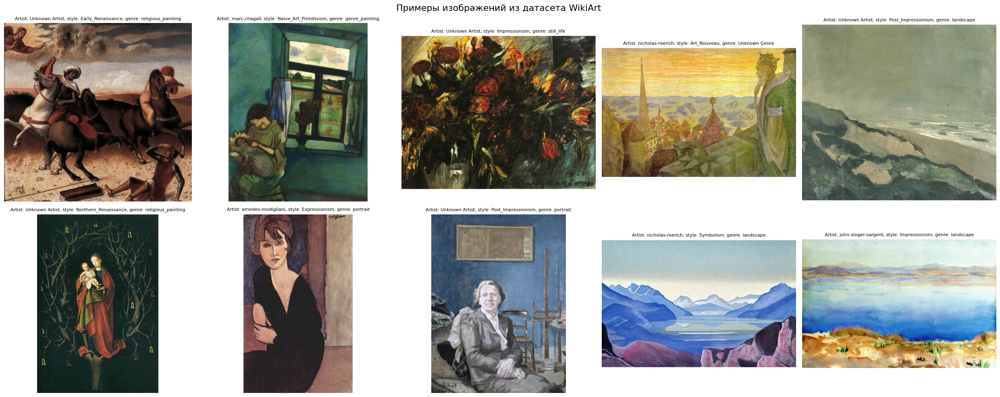

In [ ]:
artist_names = dataset.features['artist'].names
style_names = dataset.features['style'].names
genre_names = dataset.features['genre'].names

fig, axes = plt.subplots(2, 5, figsize=(25, 10))
fig.suptitle('Примеры изображений из датасета WikiArt', fontsize=16)

for i, ax in enumerate(axes.flat):
    img = dataset[i]['image']
    ax.imshow(img)
    ax.axis('off')

    ax.set_title(f"Artist: {artist_names[dataset[i]['artist']]}, style: {style_names[dataset[i]['style']]}, genre: {genre_names[dataset[i]['genre']]}", fontsize=8)

plt.tight_layout()
plt.show()


## Выбор Image Encoder

### Выбранная модель: SIGLip2-base-patch16-224.

**Почему SIGLip2**

- SIGLip2 обучен на парах изображение-текст, что позволяет работать с разными модальностями без добавления дополнительных слоев и дообучения, что пришлось бы делать с другими чисто картиночными энкодерами. Это главный параметр выбора - можно работать с мультимодальным поиском из "коробки" в дальнейших заданиях +гарантирует хорошеее семантическое понимание
- У SIGLip'а  2 очень небольшая размерность эмбеддингов (224-768), что по сравнению с ResNet-50 (2048) и EfficentNet (1280) позволит быстрее осуществлять поиск
- Модель версии base-patch16-224 занимает ±400 МБ, что является приемлемым для инференса с учетом ограниченности ресурсов
- Почему не SIGLIP/CLIP - там похожие показатели по задачам, размеру эмбеддинга и файловому размеру, но SIGLip 2 показывает наилучшие результаты

![Лидерборд](https://i.postimg.cc/9FpfDX0C/Screenshot-2025-10-30-at-16-50-18.png)

In [ ]:
# загрузка модели
model_name = "google/siglip2-base-patch16-224"

processor = AutoProcessor.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name, dtype=torch.float16).to(device)
model.eval()

SiglipModel(
  (text_model): SiglipTextTransformer(
    (embeddings): SiglipTextEmbeddings(
      (token_embedding): Embedding(256000, 768)
      (position_embedding): Embedding(64, 768)
    )
    (encoder): SiglipEncoder(
      (layers): ModuleList(
        (0-11): 12 x SiglipEncoderLayer(
          (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (self_attn): SiglipAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): SiglipMLP(
            (activation_fn): GELUTanh()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_feature

### Демонстрация получения эмбеддинга изображения


example_embedding.shape=(1, 768)


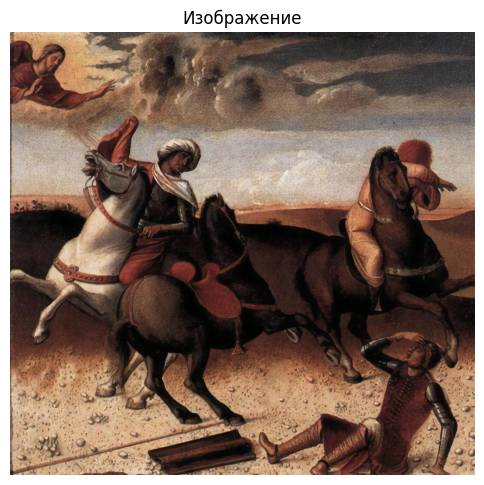

In [ ]:
def get_image_embedding(image, model, processor, device):
    inputs = processor(images=image, return_tensors="pt").to(device, model.dtype)

    with torch.no_grad():
        embedding = model.get_image_features(**inputs)
        embedding /= embedding.norm(dim=-1, keepdim=True)

    return embedding.cpu().numpy()

example_image = dataset[0]['image']
example_embedding = get_image_embedding(example_image, model, processor, device)

print(f"{example_embedding.shape=}")

plt.figure(figsize=(6, 6))
plt.imshow(example_image)
plt.title("Изображение")
plt.axis('off')
plt.show()


## Построение индекса FAISS

Я не хотела использовать IndexFlatIP, так как он предназначен для точного поиска, который довольно медленнен для больших объемов данных, поэтому буду использовать **HNSW**.


In [ ]:
batch_size = 32
all_embeddings = []

for i in tqdm(range(0, len(dataset), batch_size)):
    batch_end = min(i + batch_size, len(dataset))
    batch_images = [dataset[j]['image'] for j in range(i, batch_end)]

    inputs = processor(images=batch_images, return_tensors="pt", padding=True).to(device, model.dtype)

    with torch.no_grad():
        batch_embeddings = model.get_image_features(**inputs)
        batch_embeddings /= batch_embeddings.norm(dim=-1, keepdim=True)
        all_embeddings.append(batch_embeddings.cpu().numpy())

embeddings_matrix = np.vstack(all_embeddings).astype('float32')
print(f"{embeddings_matrix.shape=}")


  0%|          | 0/157 [00:00<?, ?it/s]

embeddings_matrix.shape=(5000, 768)


In [ ]:
dimension = embeddings_matrix.shape[1]
M = 32  # количество соседей

index = faiss.IndexHNSWFlat(dimension, M, faiss.METRIC_INNER_PRODUCT)
index.hnsw.efConstruction = 40
index.hnsw.efSearch = 16

index.add(embeddings_matrix)

# сохранение индекса на диск
index_path = "/content/drive/MyDrive/MM_HW1/image_index.bin"
faiss.write_index(index, index_path)

## Демонстрация работы



In [ ]:
import requests
from PIL import Image
import io
from matplotlib.gridspec import GridSpec

def download_image(url):
  try:
    response = requests.get(url, stream=True, timeout=10)
    response.raise_for_status()

    image_data = response.content
    pil_image = Image.open(io.BytesIO(image_data))

    if pil_image.mode != 'RGB':
        pil_image = pil_image.convert('RGB')

    return pil_image

  except Exception as e:
    return None

def search_similar_images(query_image, index, model,  processor, device, top_k=5):

    query_embedding = get_image_embedding(query_image, model, processor, device)
    distances, indices = index.search(query_embedding.astype('float32'), top_k)
    return distances[0], indices[0]

def visualize_search_results(query_url, dataset, index, model, processor, device, top_k=10):

    query_image = download_image(query_url)

    if query_image is None:
        print("Невозможно скачатьизображение.")
        return

    distances, indices = search_similar_images(query_image, index, model, processor, device, top_k)

    fig = plt.figure(figsize=(16, 8))
    fig.suptitle(f'Результаты поиска ({top_k} ближайших)', fontsize=18, fontweight='bold')

    gs = GridSpec(3, 5, figure=fig)

    ax_query = fig.add_subplot(gs[0, :])
    ax_query.imshow(query_image)
    ax_query.set_title('ЗАПРОС', fontsize=14, fontweight='bold')
    ax_query.axis('off')

    for i in range(top_k):
        if i >= len(indices):
            break

        row = 1 + (i // 5)
        col = i % 5

        ax = fig.add_subplot(gs[row, col])

        result_idx = indices[i]
        result_image = dataset[int(result_idx)]['image']
        similarity = distances[i]

        ax.imshow(result_image)
        ax.set_title(f'#{i+1} (сходство: {similarity:.3f})', fontsize=9)
        ax.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

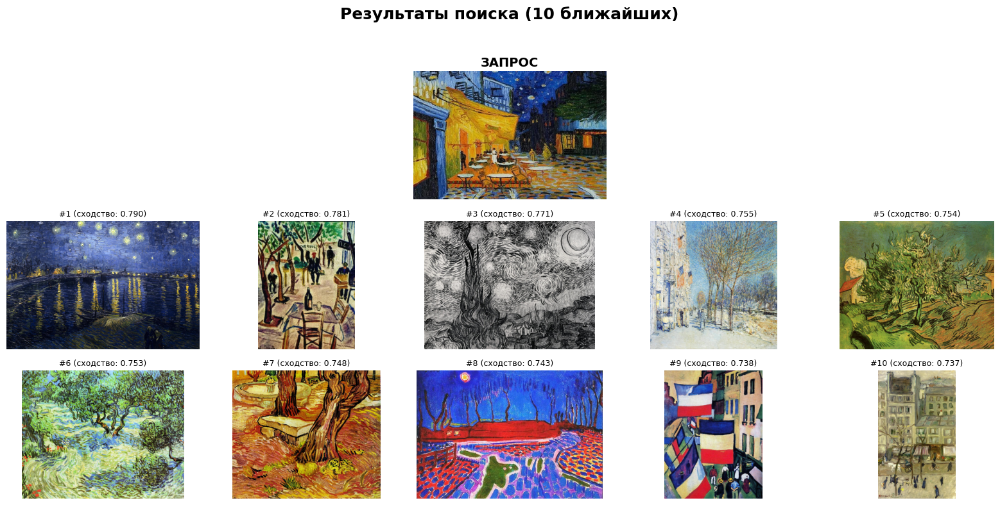

In [52]:
url = "https://i.pinimg.com/736x/07/1f/45/071f45ea2572e81056f62756977e8226.jpg" # Терасса ночного кафе - Ван Гог
visualize_search_results(url, dataset, index, model, processor, device)

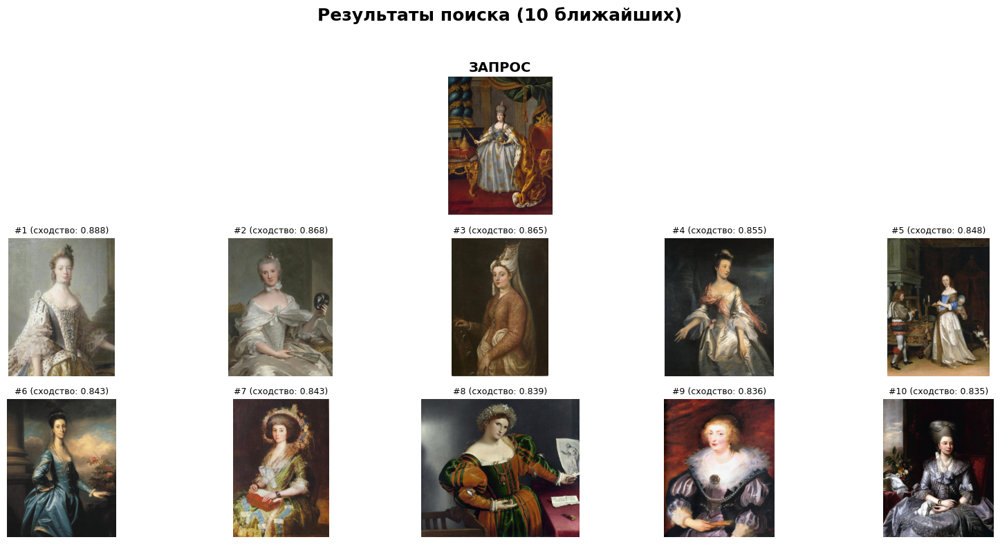

In [53]:
# Парадный портрет Екатерины II
url = "https://muzei-mira.com/templates/museum/images/paint/ekaterina-2-antropov+.jpg"
visualize_search_results(url, dataset, index, model, processor, device)

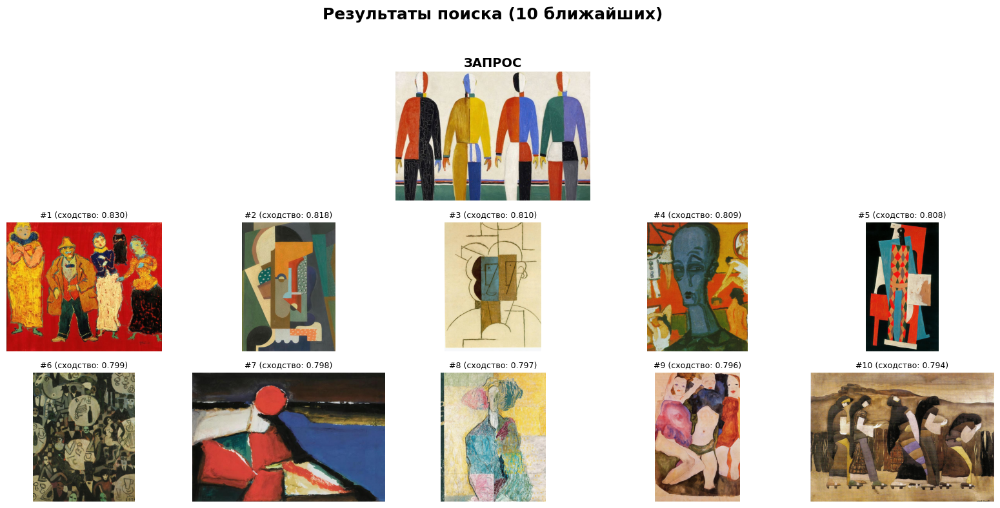

In [54]:
url = "https://aif-s3.aif.ru/images/013/650/d3a1813cbc20fbd6c7493361e9aa9f89.jpg" # Крестьяне Малевича
visualize_search_results(url, dataset, index, model, processor, device)

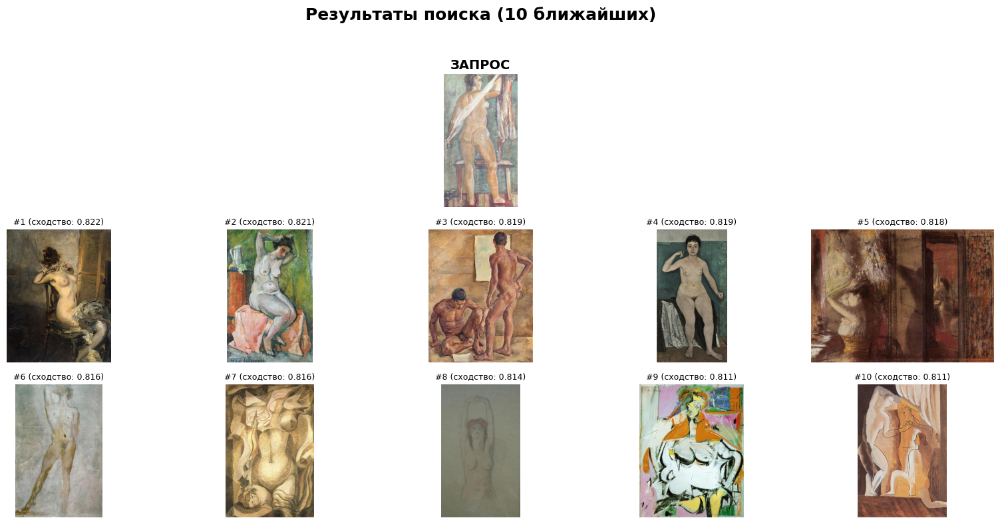

In [55]:
url = "https://artinvestment.ru/images/authors/1116=1117/2322fbe74d52a385657cb709c48a4dee_big.jpg" # Обнаженная с полотенцем, Самохвалов
visualize_search_results(url, dataset, index, model, processor, device)

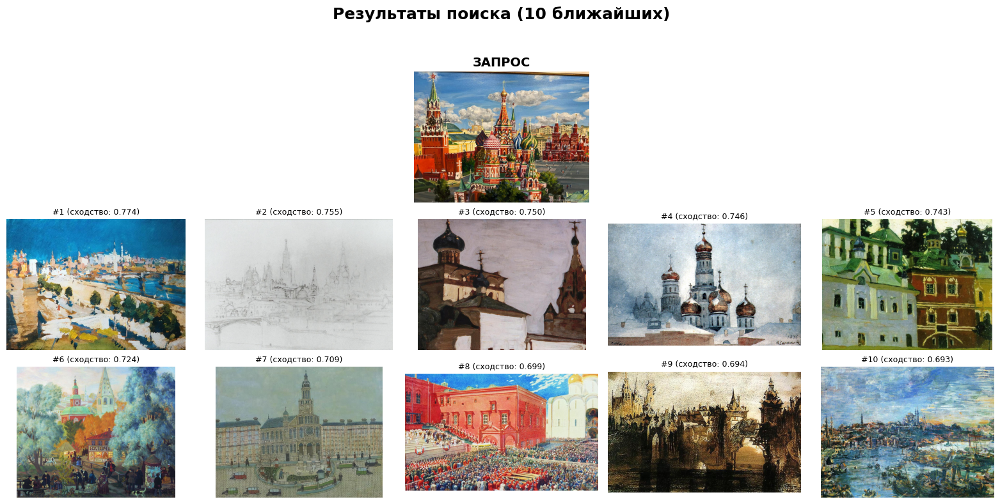

In [56]:
# Красная площадь неизвестного художника
url = "https://cs5.livemaster.ru/storage/9d/af/c76e52b453987b6a2d6372c734c9--kartiny-i-panno-kartina-maslom-pejzazh-moskva-krasnaya-plosch.jpg"
visualize_search_results(url, dataset, index, model, processor, device)

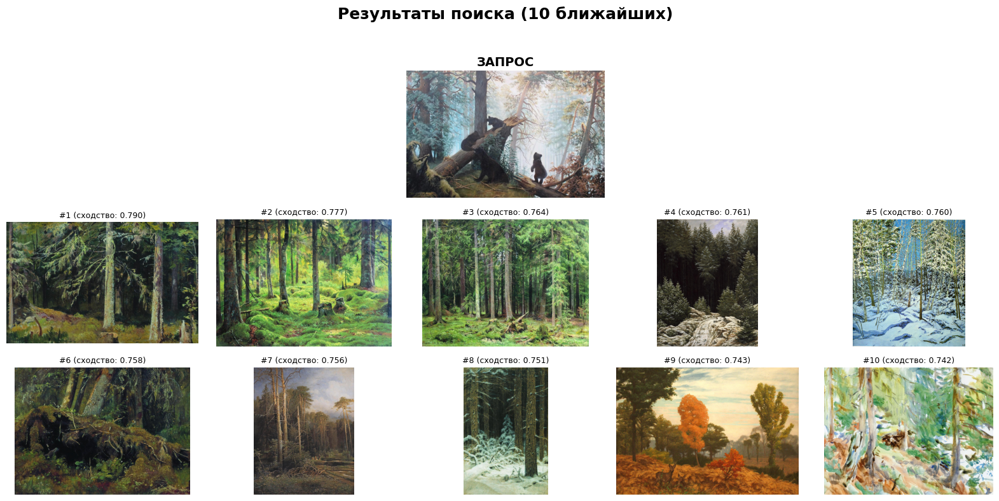

In [57]:
# Утро в сосновом бору
url = "https://avatars.dzeninfra.ru/get-zen_doc/271828/pub_681b0952e1a3d3033227c3f0_681b09ad883b57402d1bccb2/scale_1200"
visualize_search_results(url, dataset, index, model, processor, device)

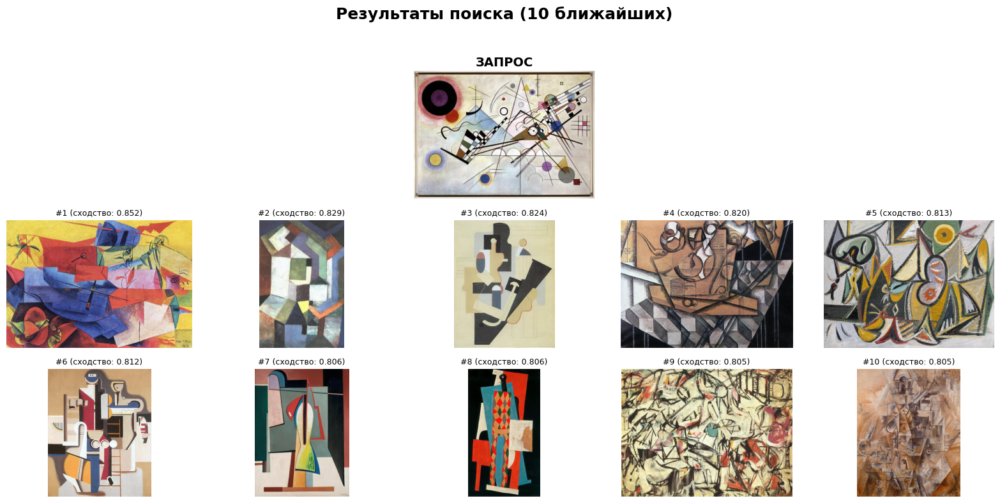

In [58]:
# Композиция VIII Василия Кандинского
url = "https://avatars.mds.yandex.net/i?id=6c7a2d64c45a424a41bc72fc08a858c68332ce28-5579871-images-thumbs&n=13"
visualize_search_results(url, dataset, index, model, processor, device)

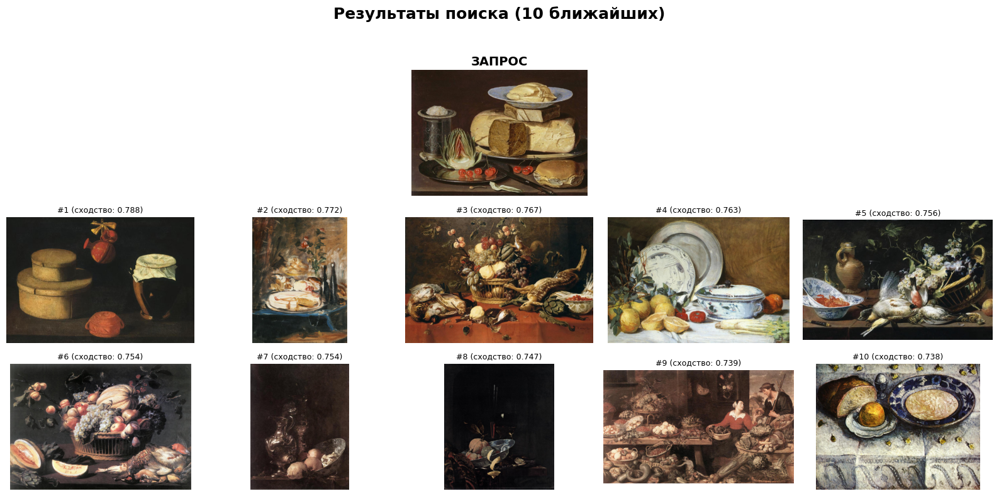

In [59]:
# Натюрморт с сырами, артишоком и вишнями, Клара Петерс
url = "https://sun9-41.userapi.com/s/v1/if2/PcW6h4b2o_jwuEIfn0dpSgDV_s19r_1YGvMadO3uhOyjR-eAQwYMZ-SJ0zRGr2k1Q5ysBLm2Kt9RTHD7s7lNxRwI.jpg?quality=95&as=32x23,48x34,72x51,108x77,160x114,240x172,360x258,480x343,540x386,640x458,720x515,1080x773,1279x915&from=bu&u=2dkbWoIEdRPgMEhqKx7tQVj1GX3-GGPjc45vzSMlLjc&cs=640x0"
visualize_search_results(url, dataset, index, model, processor, device)

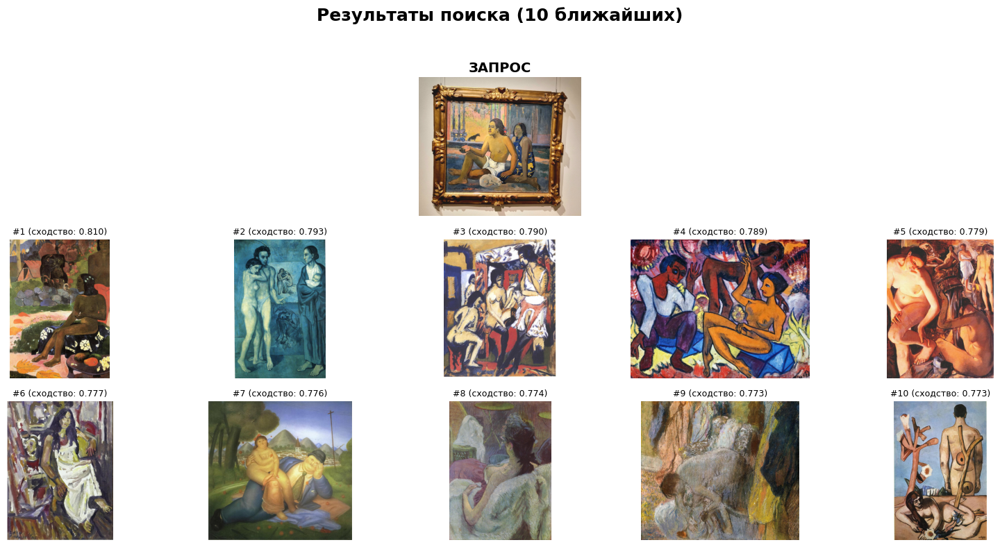

In [60]:
# Не работай. Таитяне в комнате - Гоген
url = "https://avatars.dzeninfra.ru/get-zen_doc/4389079/pub_64f56efcdef7f83261ea7044_64f596c79e331d6580c4069d/scale_1200"
visualize_search_results(url, dataset, index, model, processor, device)

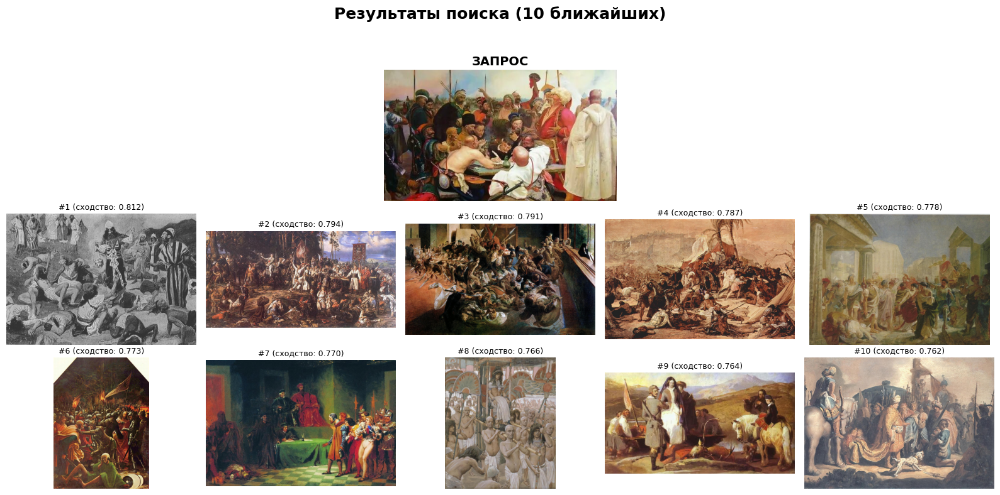

In [61]:
# Запорожцы пишут письмо турецкому султану
url = "https://avatars.mds.yandex.net/i?id=d14bf2a65a6ab0cc7dcfe5d11521067625b43eba-4337876-images-thumbs&n=13"
visualize_search_results(url, dataset, index, model, processor, device)